[![image](https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png)](https://www.visual-layer.com)

# Analyzing Roboflow Universe Datasets

[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/visual-layer/fastdup/blob/main/examples/analyzing-kaggle-datasets.ipynb)
[![Open in Kaggle](https://kaggle.com/static/images/open-in-kaggle.svg)](https://kaggle.com/kernels/welcome?src=https://github.com/visual-layer/fastdup/blob/main/examples/analyzing-kaggle-datasets.ipynb)

This notebook shows how you can use [fastdup](https://github.com/visual-layer/fastdup) to analyze any computer vision datasets from [Roboflow Universe](https://universe.roboflow.com/).

## Sign Up and Search Dataset

First, [sign-up for an account](https://app.roboflow.com/) - for free.

You can now search for any dataset on the [platform](https://universe.roboflow.com/) using keywords.

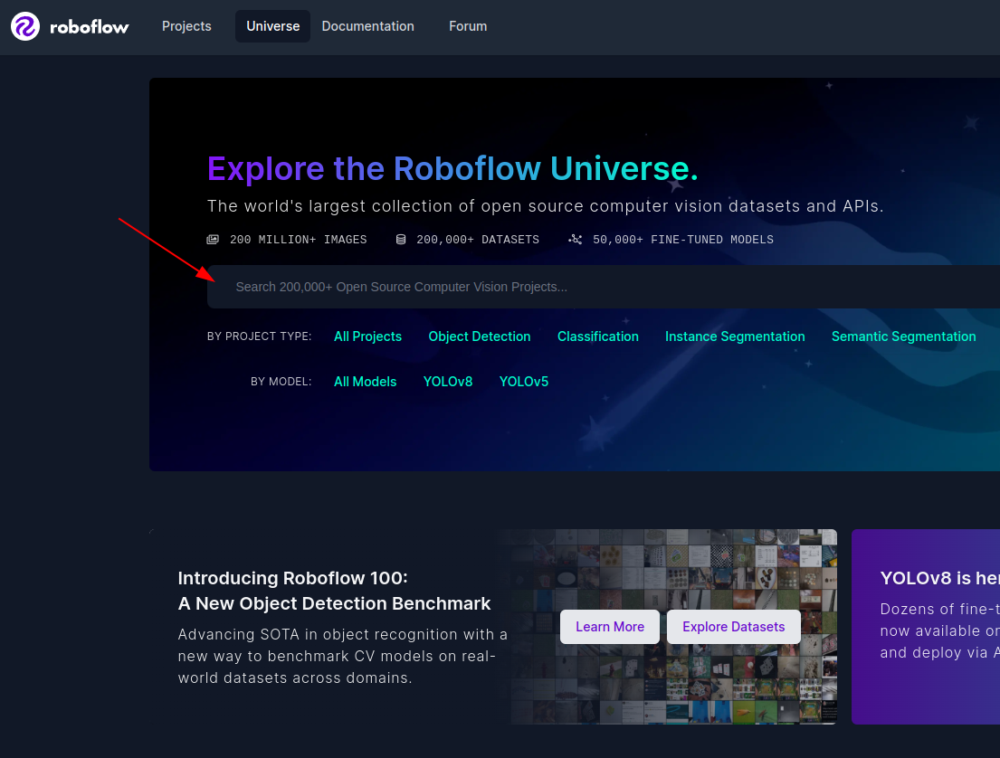

Upon finding your dataset of interest, click on the 'Download Dataset' button on the dataset page.

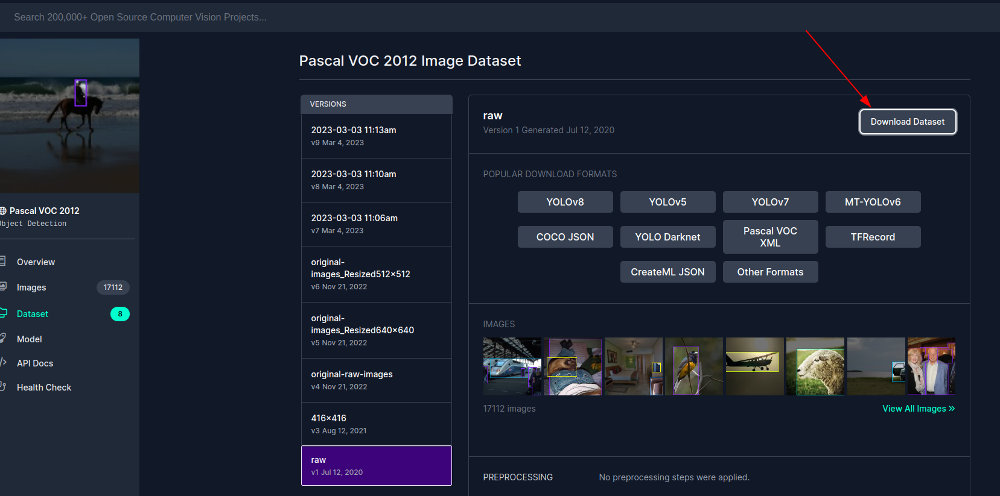

Copy the code snippet into your notebook.

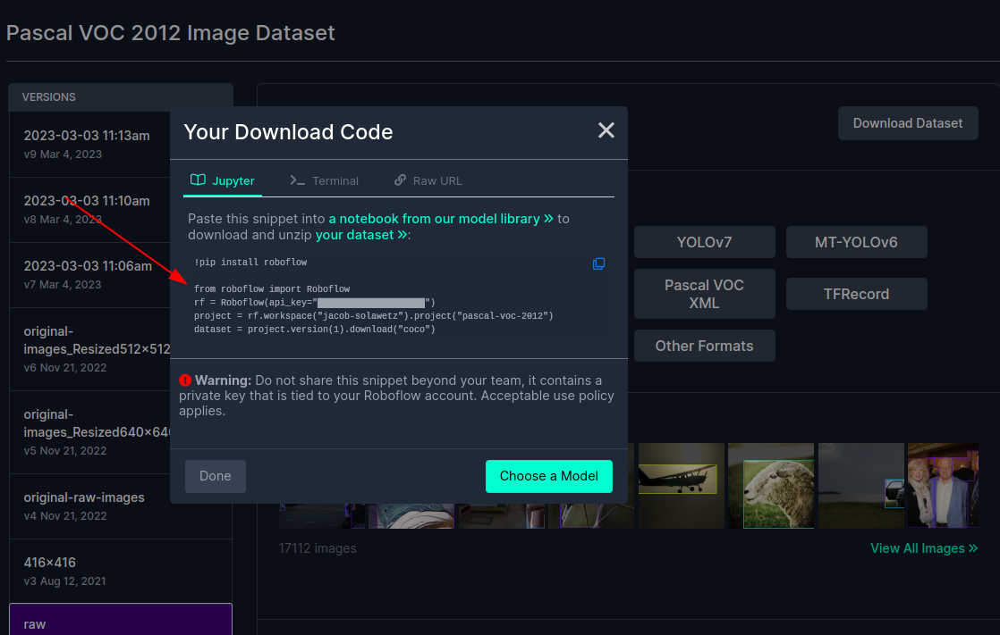

## Install Roboflow Python Package
The Roboflow Python Package is a python wrapper around the core Roboflow web application and REST API.

This package lets us download from over 200,000 datasets from [Roboflow Universe](https://universe.roboflow.com/).

In [ ]:
!pip install -Uq roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="YOUR_API_KEY")

## Download Dataset

In this notebook we will downlaod the Pascal VOC 2012 dataset in COCO format into our local folder.

> Replace `YOUR_API_KEY` with your own API key from Roboflow.

In [ ]:
project = rf.workspace("dash101").project("dash-diet-101")
dataset = project.version(4).download("coco")

## Install fastdup

Next, install fastdup and verify the installation.

In [80]:
!pip install -Uq fastdup

Now, test the installation. If there's no error message, we are ready to go.

In [81]:
import fastdup
fastdup.__version__

'1.33'

## Run fastdup
To run fastdup, we only need to point `input_dir` to the folder containing images from the dataset.

In [ ]:
fd = fastdup.create(input_dir='./DASH-DIET-101-4/train')
fd.run(annotations='DASH-DIET-101-4/train/_annotations.coco.json')

## Inspect Issues

From the summary above, we have 1 corrupted image. Let's get some more details with:

There are several other methods we can use to inspect and visualize the issues found:

```python
fd.vis.duplicates_gallery()    # create a visual gallery of duplicates
fd.vis.outliers_gallery()      # create a visual gallery of anomalies
fd.vis.component_gallery()     # create a visualization of connected components
fd.vis.stats_gallery()         # create a visualization of images statistics (e.g. blur)
fd.vis.similarity_gallery()    # create a gallery of similar images
```

## Invalid Bounding Boxes 
Bounding boxes that are either too small or go beyond image boundaries are flagged as bad bounding box in fastdup. 

Let's get the invalid bounding boxes:

In [107]:
fd.invalid_instances()

,col_x,row_y,width,height,label,crop_filename,filename,index,is_valid
20121,0,27,413.638,388.924,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.9676c410f32974f8bd53b6c47db156e5.jpg_0_27_413_388.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.9676c410f32974f8bd53b6c47db156e5.jpg,NaN,False
20181,20,0,390.749,415.651,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.a4d236ef9262303f7fc5e96b4304715e.jpg_20_0_390_415.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.a4d236ef9262303f7fc5e96b4304715e.jpg,NaN,False
20492,0,20,413.601,396.000,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.60d7efa443842a8ea2171337e8b6a49a.jpg_0_20_413_396.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.60d7efa443842a8ea2171337e8b6a49a.jpg,NaN,False
20549,27,0,389.000,413.900,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.6c341a80af6fa9f88bd52d8722576e9c.jpg_27_0_389_413.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.6c341a80af6fa9f88bd52d8722576e9c.jpg,NaN,False
20643,20,0,393.171,414.835,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.824f970fd2fda50dcaf15bf12108f10b.jpg_20_0_393_414.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.824f970fd2fda50dcaf15bf12108f10b.jpg,NaN,False
...,...,...,...,...,...,...,...,...,...
85351,0,122,9.757,38.815,Blackberry,NaN,NaN,NaN,False
85775,27,195,1.082,1.052,White Egg,NaN,NaN,NaN,False
85932,394,195,1.047,1.064,White Egg,NaN,NaN,NaN,False
85963,403,190,1.006,1.076,White Egg,NaN,NaN,NaN,False


We can also get a list of bad bounding boxes by reading the `atrain_features.bad.csv` file.

In [108]:
import pandas as pd
bad_bb = pd.read_csv('work_dir/full_image_run/atrain_features.bad.csv')

In [109]:
bad_bb

,index,filename,error_code
0,23513,DASH-DIET-101-4/train/untitled-2-1-_jpg.rf.2cc0804ad0a8d457291b39d72b32ea1f.jpg,ERROR_BAD_BOUNDING_BOX
1,24030,DASH-DIET-101-4/train/IMG_1282_jpg.rf.e5d454a356160bd444b71e19c9350f72.jpg,ERROR_BAD_BOUNDING_BOX
2,24068,DASH-DIET-101-4/train/IMG_1282_jpg.rf.f669ecf808bd1721e724ef14c7ede206.jpg,ERROR_BAD_BOUNDING_BOX
3,29989,DASH-DIET-101-4/train/Almond_13-Original-Size-_jpg.rf.61e38e0da9a2aa99b20ff801c44a47dd.jpg,ERROR_BAD_BOUNDING_BOX
4,35693,DASH-DIET-101-4/train/carrot_93_jpg.rf.a242faf4608f26c230f476b5feb9f27c.jpg,ERROR_BAD_BOUNDING_BOX
...,...,...,...
17,85351,DASH-DIET-101-4/train/Single-Blackberries_28_jpg.rf.465b276617c3780db8a717ce58c49ba9.jpg,ERROR_BAD_BOUNDING_BOX
18,85775,DASH-DIET-101-4/train/Egg-images_43_jpg.rf.28d73a7161b833d02ef40017086a9948.jpg,ERROR_BAD_BOUNDING_BOX
19,85932,DASH-DIET-101-4/train/Egg-images_43_jpg.rf.0c240a42a1d5a122bf0df56c6737ce1f.jpg,ERROR_BAD_BOUNDING_BOX
20,85963,DASH-DIET-101-4/train/Egg-images_43_jpg.rf.0d7f52ff01b12da4a0e1860cef3755fa.jpg,ERROR_BAD_BOUNDING_BOX


In [110]:
bad_bb['error_code'].value_counts()

error_code
ERROR_BAD_BOUNDING_BOX    22
Name: count, dtype: int64

## Duplicate/Near Duplicates

100%|██████████████████| 20/20 [00:00<00:00, 187.91it/s]


Stored similarity visual view in  work_dir/galleries/duplicates.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



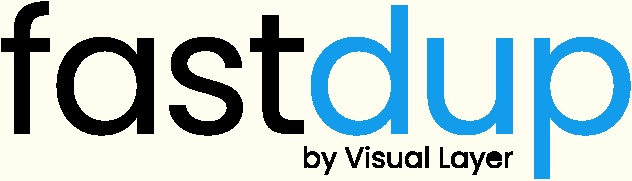
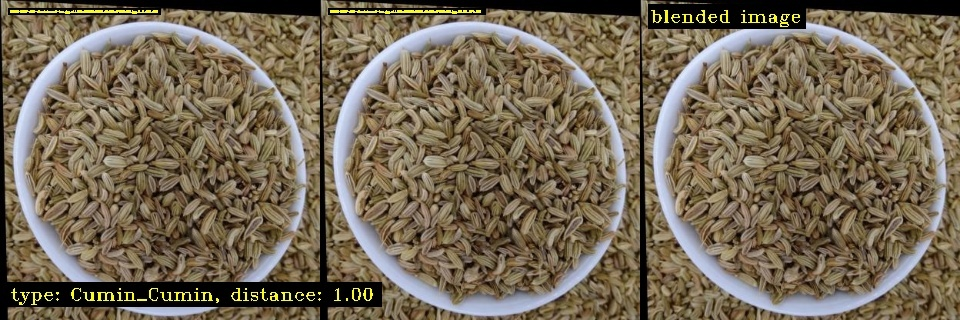
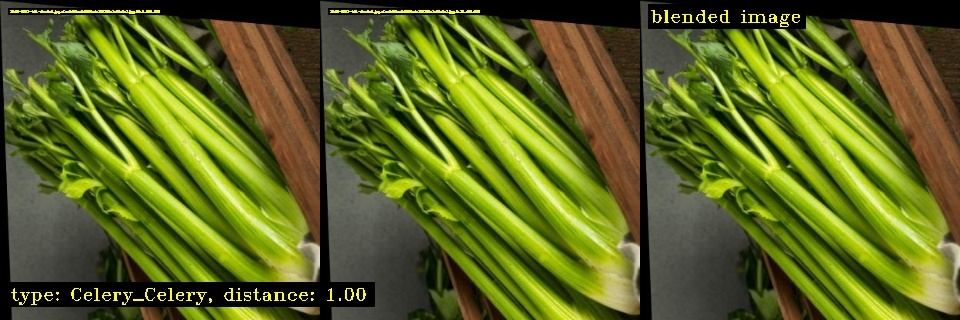
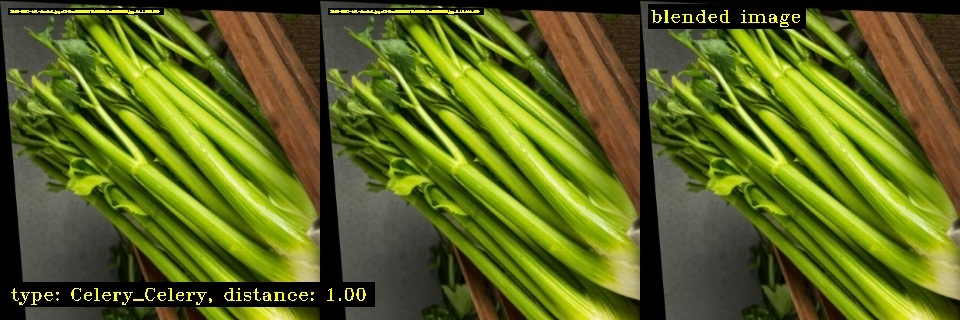
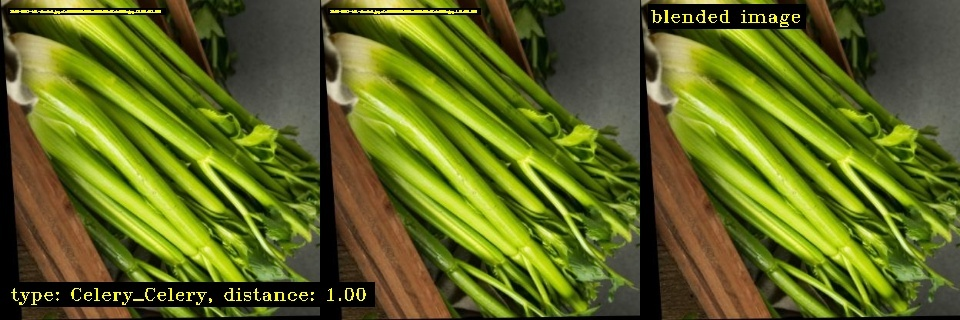
...
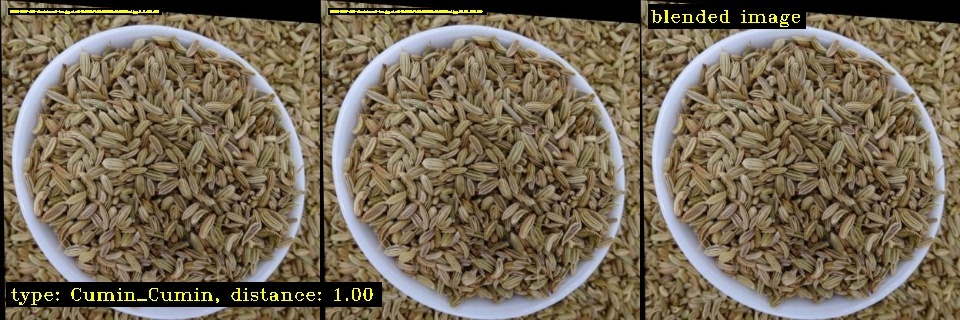
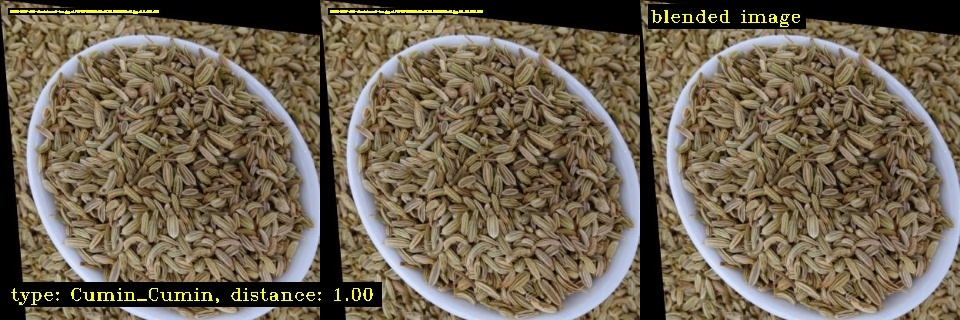
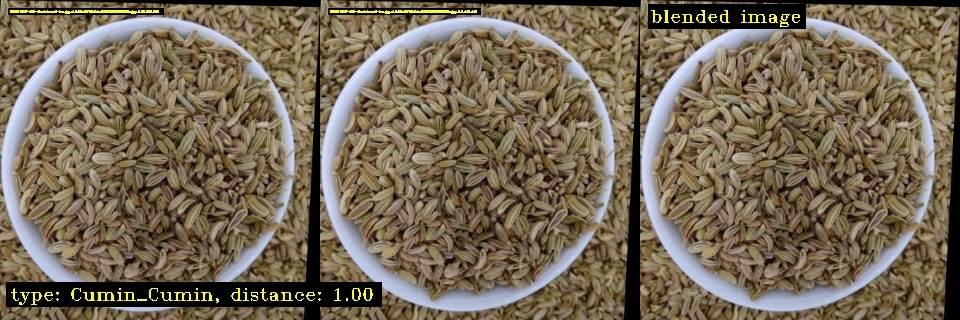
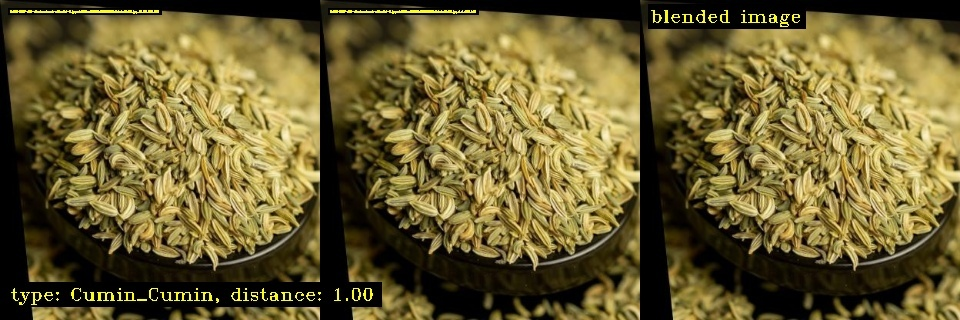
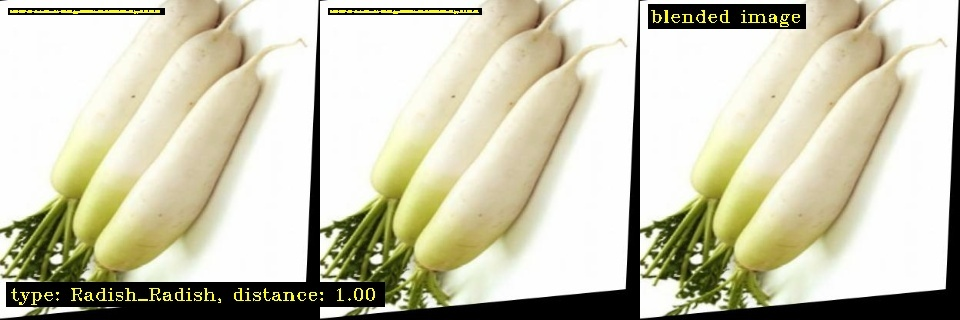

0

In [111]:
fd.vis.duplicates_gallery()

Now let's get the number of exact/near duplicates.

In [112]:
similarity_df = fd.similarity()
exact_duplicates = similarity_df[similarity_df["distance"] >= 0.97]

exact_duplicates = exact_duplicates[['distance', 'crop_filename_from', 'crop_filename_to']]
exact_duplicates

,distance,crop_filename_from,crop_filename_to
0,1.000000,work_dir/crops/DASH-DIET-101-4trainfennel-tea_jpg.rf.1343a69921142131e5b1f7af7212b98f.jpg_0_0_416_416.jpg,work_dir/crops/DASH-DIET-101-4trainfennel-tea_jpg.rf.1343a69921142131e5b1f7af7212b98f.jpg_25_30_374_373.jpg
1,1.000000,work_dir/crops/DASH-DIET-101-4trainfennel-tea_jpg.rf.dc86af67b7efcba08b1f79d800f5923a.jpg_9_30_382_365.jpg,work_dir/crops/DASH-DIET-101-4trainfennel-tea_jpg.rf.dc86af67b7efcba08b1f79d800f5923a.jpg_0_0_416_416.jpg
2,1.000000,work_dir/crops/DASH-DIET-101-4trainwhiteradish-400x284_jpg.rf.8362129dec556ed7e0d1946c367bc184.jpg_33_58_360_354.jpg,work_dir/crops/DASH-DIET-101-4trainwhiteradish-400x284_jpg.rf.8362129dec556ed7e0d1946c367bc184.jpg_45_0_318_401.jpg
3,1.000000,work_dir/crops/DASH-DIET-101-4trainwhiteradish-400x284_jpg.rf.8362129dec556ed7e0d1946c367bc184.jpg_45_0_318_401.jpg,work_dir/crops/DASH-DIET-101-4trainwhiteradish-400x284_jpg.rf.8362129dec556ed7e0d1946c367bc184.jpg_33_58_360_354.jpg
4,1.000000,work_dir/crops/DASH-DIET-101-4trainaniseed-editorial-2_jpg.rf.b445ce541100767c16e7cf87301575d7.jpg_0_0_416_416.jpg,work_dir/crops/DASH-DIET-101-4trainaniseed-editorial-2_jpg.rf.b445ce541100767c16e7cf87301575d7.jpg_52_6_327_396.jpg
...,...,...,...
45545,0.970002,work_dir/crops/DASH-DIET-101-4trainFNKLive_Michael-Symon-Simple-Steamed-Mussels_0014_s4x3_jpg.rf.a8962d911e58edd7738e6c579da27798.jpg_93_77_284_329.jpg,work_dir/crops/DASH-DIET-101-4trainFNKLive_Michael-Symon-Simple-Steamed-Mussels_0014_s4x3_jpg.rf.1d01011262f3bcb0bcb89f84f64d310d.jpg_89_78_288_332.jpg
45546,0.970002,work_dir/crops/DASH-DIET-101-4trainFNKLive_Michael-Symon-Simple-Steamed-Mussels_0014_s4x3_jpg.rf.1d01011262f3bcb0bcb89f84f64d310d.jpg_89_78_288_332.jpg,work_dir/crops/DASH-DIET-101-4trainFNKLive_Michael-Symon-Simple-Steamed-Mussels_0014_s4x3_jpg.rf.a8962d911e58edd7738e6c579da27798.jpg_93_77_284_329.jpg
45547,0.970001,work_dir/crops/DASH-DIET-101-4traingrapefruit-in-india_98_jpg.rf.ecea7f1024e8f3c277f58c55c0f92fe7.jpg_9_197_321_198.jpg,work_dir/crops/DASH-DIET-101-4traingrapefruit-in-india_98_jpg.rf.354dd8d6832690b72dc877b669673479.jpg_48_199_315_196.jpg
45548,0.970001,work_dir/crops/DASH-DIET-101-4traingrapefruit-in-india_98_jpg.rf.354dd8d6832690b72dc877b669673479.jpg_48_199_315_196.jpg,work_dir/crops/DASH-DIET-101-4traingrapefruit-in-india_98_jpg.rf.ecea7f1024e8f3c277f58c55c0f92fe7.jpg_9_197_321_198.jpg


A `distance` value of `1.0` indicates an exact duplicate.

## Image Clusters

Turmeric Powder


100%|███████████████████| 20/20 [00:00<00:00, 30.09it/s]


Finished OK. Components are stored as image files work_dir/galleries/components_[index].jpg
Stored components visual view in  work_dir/galleries/components.html
Execution time in seconds 5.5
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



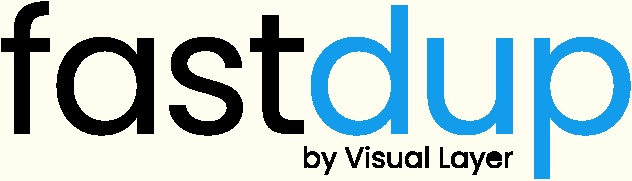
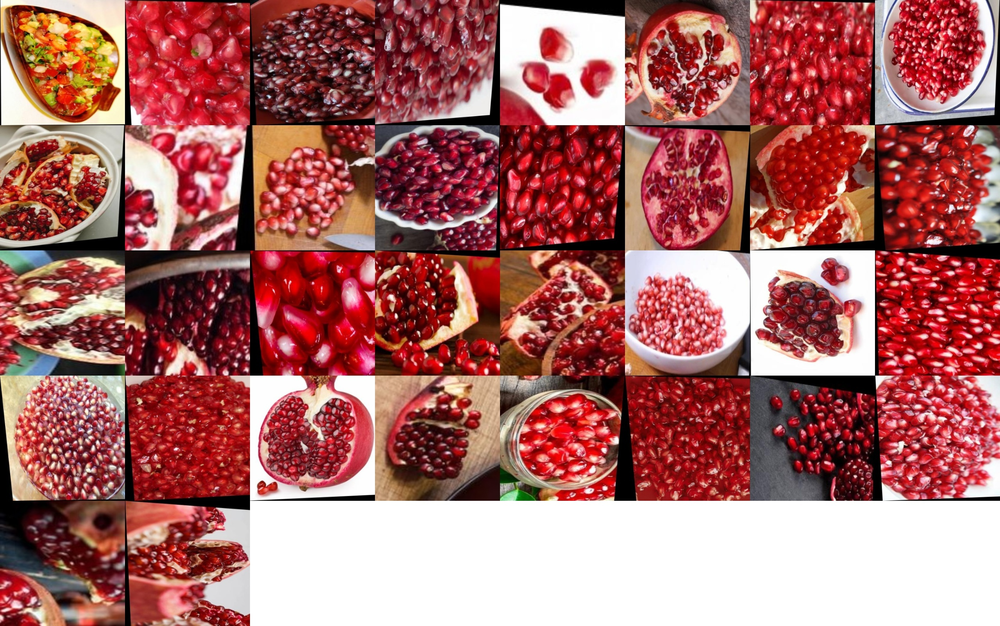
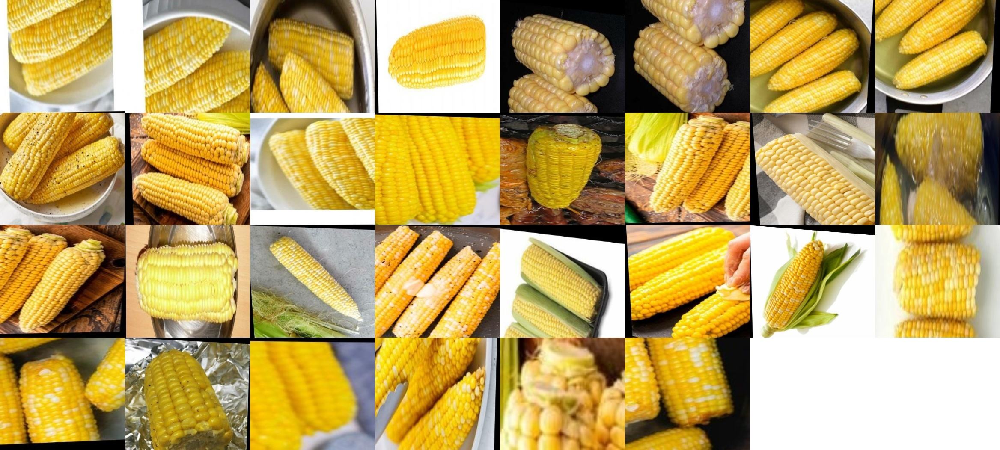
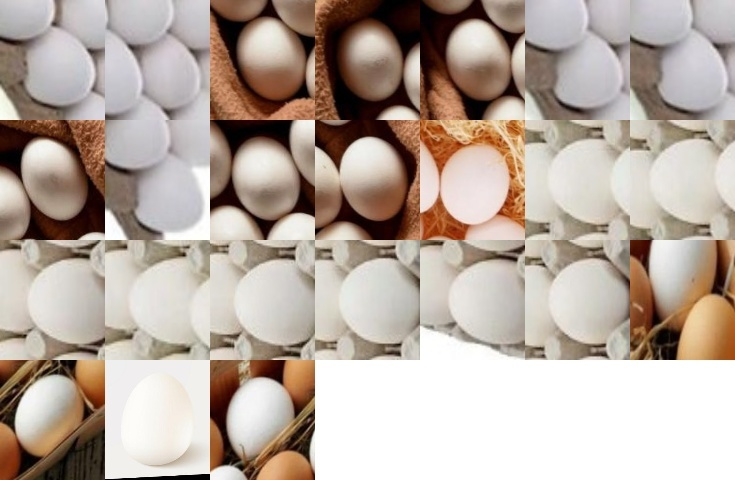
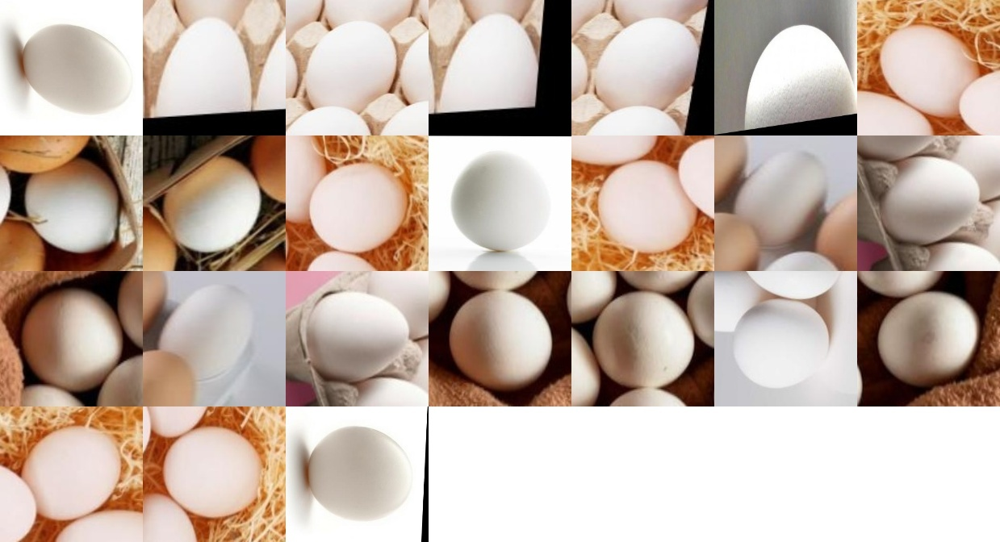
...
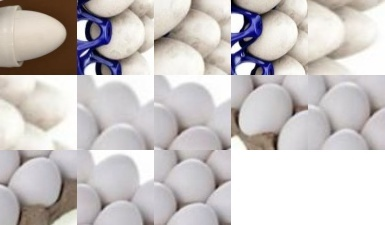
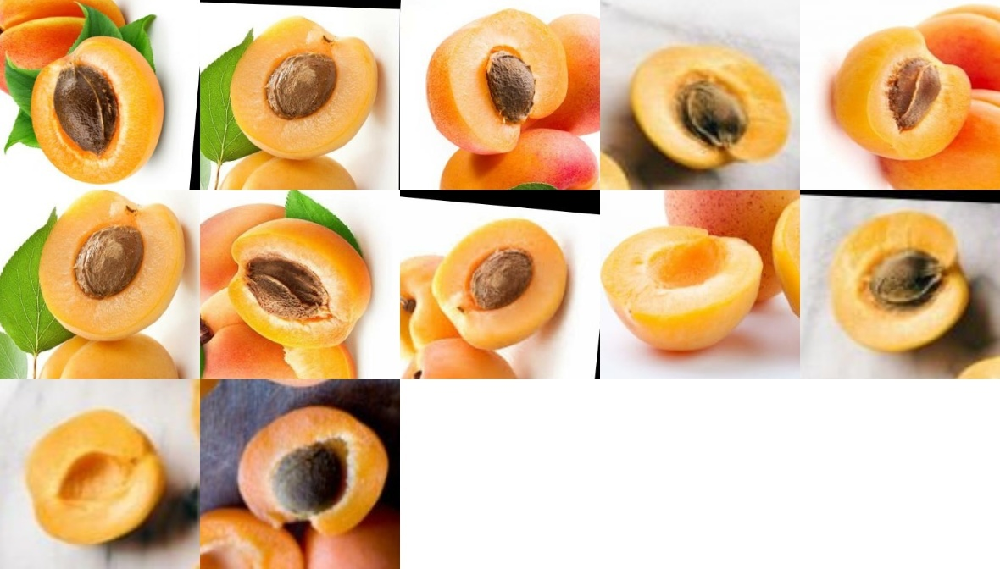
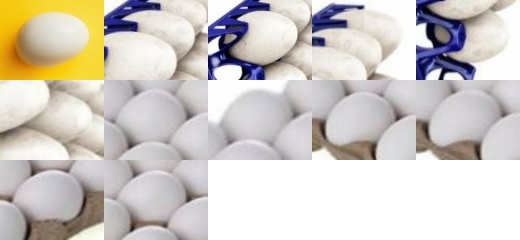
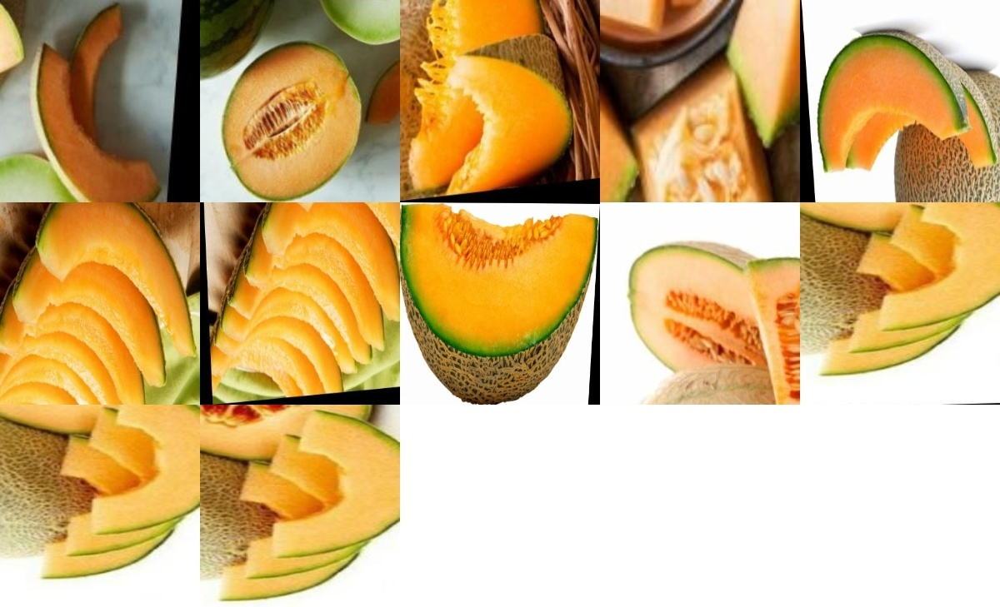
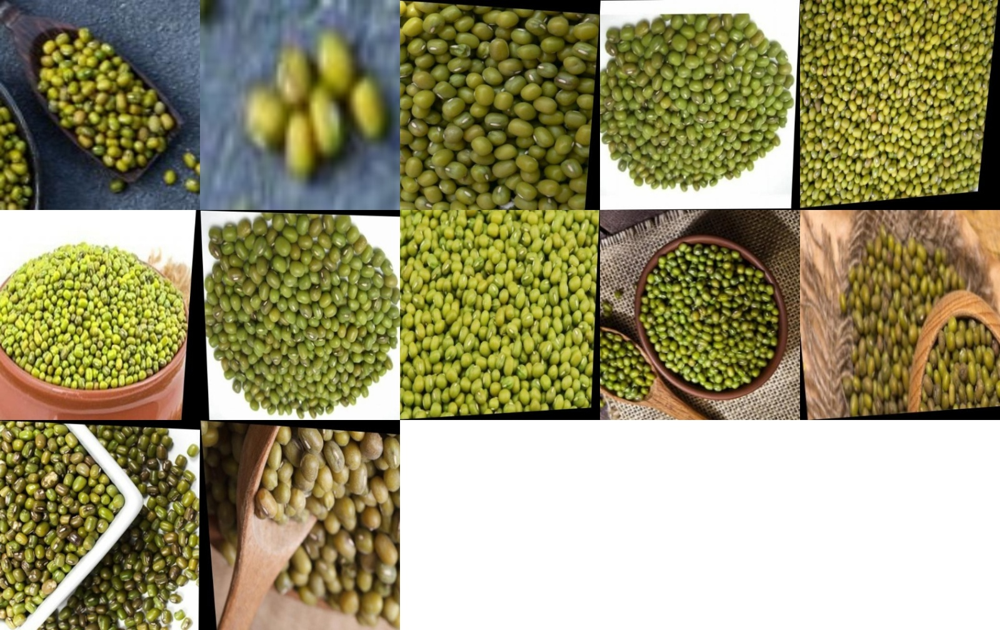

0

In [113]:
fd.vis.component_gallery()

## Statistical Gallery


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
100%|██████████████████| 20/20 [00:00<00:00, 363.26it/s]

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Stored blur visual view in  work_dir/galleries/blur.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



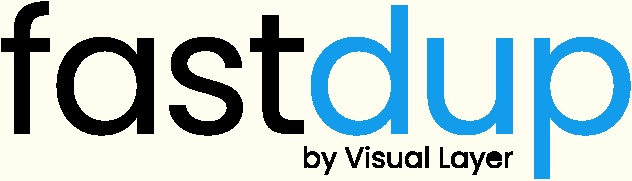
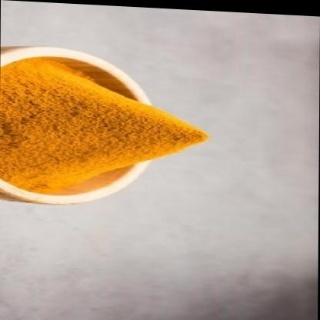
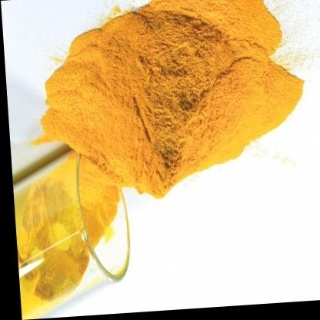
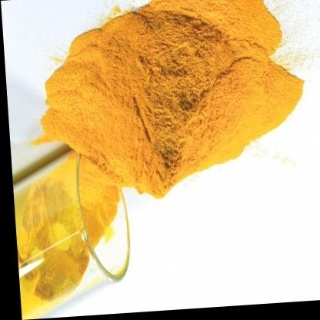
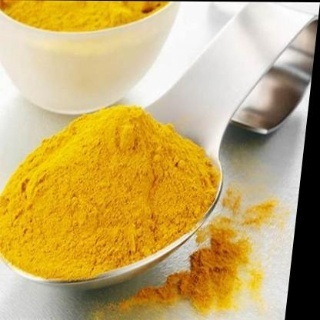
...
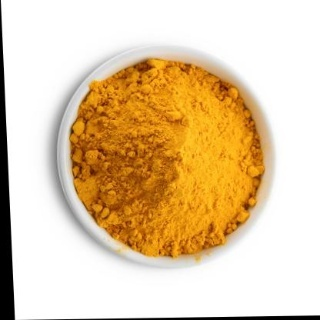
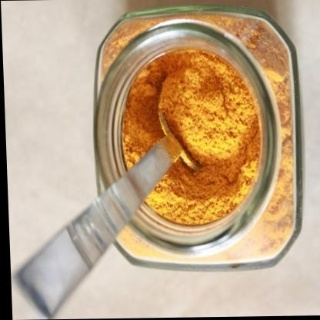
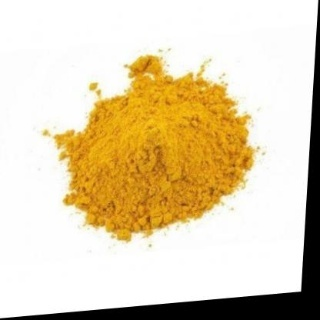
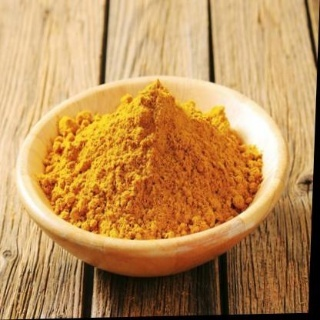
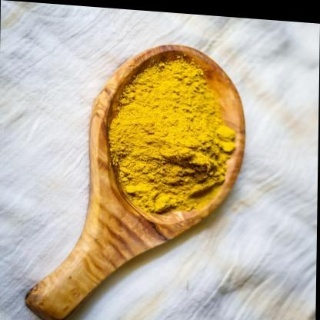

0

In [115]:
fd.vis.stats_gallery(metric='blur')

## Similarity Gallery

100%|██████████████████| 20/20 [00:00<00:00, 103.97it/s]


Stored similar images visual view in  work_dir/galleries/similarity.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



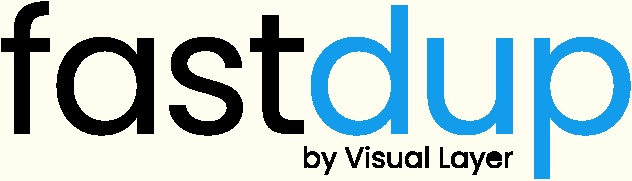
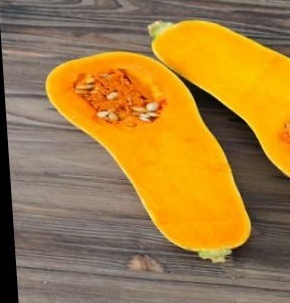
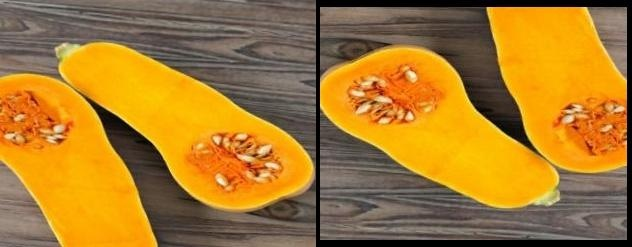
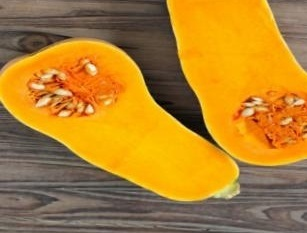
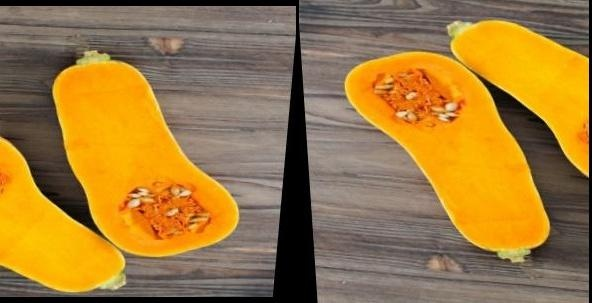
...
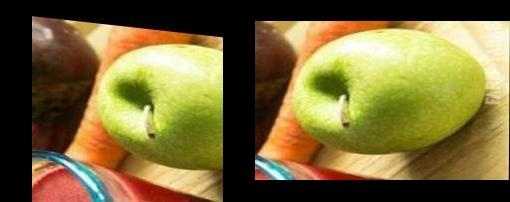
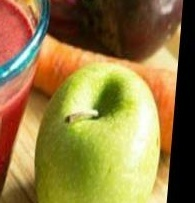
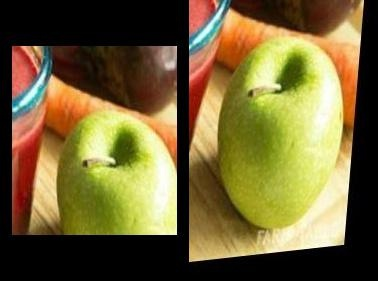
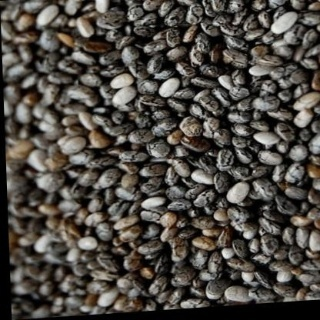
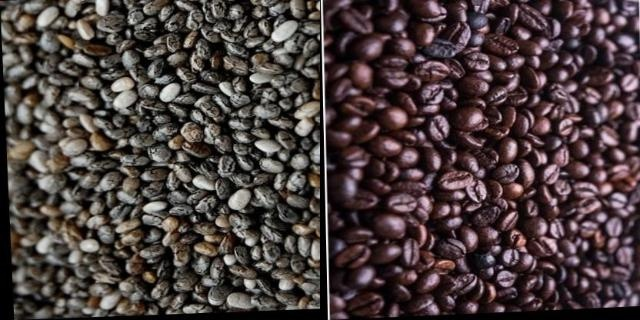

,from,to,label,label2,distance,score,length
33676,work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.3f60f16b0b3f608c9334249ab5d256c1.jpg_48_125_208_217.jpg,"[work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.d4c7ea155dfc6b23567a265feaea058c.jpg_0_172_256_167.jpg, work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.3f60f16b0b3f608c9334249ab5d256c1.jpg_152_95_262_177.jpg]","[Cabbage, Cabbage]","[Butternut Squash, Butternut Squash]","[0.921751, 0.946037]",0.0,2
33857,work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.d4c7ea155dfc6b23567a265feaea058c.jpg_0_172_256_167.jpg,"[work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.3f60f16b0b3f608c9334249ab5d256c1.jpg_48_125_208_217.jpg, work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.d4c7ea155dfc6b23567a265feaea058c.jpg_156_95_212_209.jpg]","[Butternut Squash, Butternut Squash]","[Cabbage, Cabbage]","[0.921751, 0.939066]",0.0,2
49590,work_dir/crops/DASH-DIET-101-4traincantaloupe_37_jpg.rf.7a0f7d29db52e2891b75e76f0def016b.jpg_5_264_306_152.jpg,"[work_dir/crops/DASH-DIET-101-4traincantaloupe_37_jpg.rf.0fd526591ebaf21d3be7ebd9a91f76a7.jpg_168_206_248_137.jpg, work_dir/crops/DASH-DIET-101-4traincantaloupe_37_jpg.rf.7a0f7d29db52e2891b75e76f0def016b.jpg_172_234_244_147.jpg]","[Cantaloupe, Cantaloupe]","[Honeydew Melon, Honeydew Melon]","[0.926915, 0.934811]",0.0,2
70819,work_dir/crops/DASH-DIET-101-4trainraw-black-eyed-peas_58_jpg.rf.a6749033b65b6dfe61e0f08cefb99638.jpg_0_0_416_415.jpg,"[work_dir/crops/DASH-DIET-101-4trainOIP-2-_jpg.rf.e98ee490a0b198088426d4e149f314bc.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainmIiR4LG_jpg.rf.ae8dda4a436b57d53ca92ade2d16d2e9.jpg_0_0_416_416.jpg]","[Black-eyed peas, Black-eyed peas]","[Barley, Barley]","[0.902716, 0.905886]",0.0,2
728,work_dir/crops/DASH-DIET-101-4train062-1_jpg.rf.b9171784d0840c1a7a897679476fb58b.jpg_7_0_255_256.jpg,"[work_dir/crops/DASH-DIET-101-4train062-1_jpg.rf.b9171784d0840c1a7a897679476fb58b.jpg_58_31_276_342.jpg, work_dir/crops/DASH-DIET-101-4train062-1_jpg.rf.7b7666b90a254bf5bd7147c973475782.jpg_11_0_251_256.jpg]","[Coriander, Coriander]","[Guacamole, Coriander]","[0.942884, 0.969112]",50.0,2
...,...,...,...,...,...,...,...
79778,work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.008bfdce21926d983f232c135a60c1cd.jpg_0_0_416_416.jpg,"[work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.c5afc6dd4db02f778cd1edec9d7eef21.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.a80491250152838364d47c21c20b5b65.jpg_0_0_416_416.jpg]","[Kimchi, Kimchi]","[Kimchi, Kimchi]","[0.964825, 0.977222]",100.0,2
79779,work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.2ed9f9348082476ab79a73514c665db0.jpg_0_0_416_416.jpg,"[work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.008bfdce21926d983f232c135a60c1cd.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.9abfafea9e8bd2e11a9c92fcfa053397.jpg_0_0_416_416.jpg]","[Kimchi, Kimchi]","[Kimchi, Kimchi]","[0.938893, 0.958767]",100.0,2
79780,work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.9abfafea9e8bd2e11a9c92fcfa053397.jpg_0_0_416_416.jpg,"[work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.008bfdce21926d983f232c135a60c1cd.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.2ed9f9348082476ab79a73514c665db0.jpg_0_0_416_416.jpg]","[Kimchi, Kimchi]","[Kimchi, Kimchi]","[0.931318, 0.958767]",100.0,2
79781,work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.a80491250152838364d47c21c20b5b65.jpg_0_0_416_416.jpg,"[work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.c5afc6dd4db02f778cd1edec9d7eef21.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.008bfdce21926d983f232c135a60c1cd.jpg_0_0_416_416.jpg]","[Kimchi, Kimchi]","[Kimchi, Kimchi]","[0.963139, 0.977222]",100.0,2


In [116]:
fd.vis.similarity_gallery(slice='diff')

## Wrap Up

That's a wrap! In this notebook we showed how you load dataset from Kaggle and analyze it using fastdup. You can use similar methods to run on other similar datasets on [Roboflow Universe](https://universe.roboflow.com/).

Try it out and let us know what issues you find.


Next, feel free to check out other tutorials -

+ ⚡ [**Quickstart**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/quick-dataset-analysis.ipynb): Learn how to install fastdup, load a dataset and analyze it for potential issues such as duplicates/near-duplicates, broken images, outliers, dark/bright/blurry images, and view visually similar image clusters. If you're new, start here!
+ 🧹 [**Clean Image Folder**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/cleaning-image-dataset.ipynb): Learn how to analyze and clean a folder of images from potential issues and export a list of problematic files for further action. If you have an unorganized folder of images, this is a good place to start.
+ 🖼 [**Analyze Image Classification Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-image-classification-dataset.ipynb): Learn how to load a labeled image classification dataset and analyze for potential issues. If you have labeled ImageNet-style folder structure, have a go!
+ 🎁 [**Analyze Object Detection Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-object-detection-dataset.ipynb): Learn how to load bounding box annotations for object detection and analyze for potential issues. If you have a COCO-style labeled object detection dataset, give this example a try. 


# VL Profiler
If you prefer a no-code platform to inspect and visualize your dataset, [**try our free cloud product VL Profiler**](https://app.visual-layer.com) - VL Profiler is our first no-code commercial product that lets you visualize and inspect your dataset in your browser. 

[Sign up](https://app.visual-layer.com) now, it's free.

[![image](https://raw.githubusercontent.com/visual-layer/fastdup/main/gallery/vl_profiler_promo.svg)](https://app.visual-layer.com)

As usual, feedback is welcome! 

Questions? Drop by our [Slack channel](https://visualdatabase.slack.com/join/shared_invite/zt-19jaydbjn-lNDEDkgvSI1QwbTXSY6dlA#/shared-invite/email) or open an issue on [GitHub](https://github.com/visual-layer/fastdup/issues).